### CURRENT DIRECTORY

In [2]:
pwd

'C:\\Users\\Baron\\Desktop\\EE_258_Repo\\EE_258\\ML_PATH_EE258\\EE258_env\\projects'

In [4]:
import tensorflow as tf
print(tf.__version__)


2.18.0


### Pathing
    a. Baron's Pathing: 
        Main Location:'C:\\Users\\Baron\\Desktop\\EE_258_Repo\\EE_258\\ML_PATH_EE258\\EE258_env\\projects'
        Dataset: C:\Users\Baron\Documents\Grad_School\EE_258\project
        
    b. Hunter's Pathing:
        Main Location: '/Users/hunterakers/MachineLearning/my_env'
        Dataset: /Users/hunterakers/MachineLearning/my_env/DATASETS

### EE 258 Project Code

Table of Contents
    
    Part a) Preliminary Setup
    Part b) Dataset Description
    Part c) Dataset Visualization
    Part d) Pre Processing
    Part e) BASELINE MODEL
    Part f) MODELS UTILIZED: To be finished
    Part g) MODEL IMPROVEMENTS: To be finished
    Part h) PERFORMANCE & CONCLUSIONS: To be finished
    Part e) To be finished

### Part a) Preliminary Setup
    1. Import Necessary Libraries
    2. Import the Dataset

In [9]:
#1. Import Necessary Liobraries
import pandas as pd
import numpy as np
from PIL import Image
from tqdm import tqdm
import os

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, AveragePooling2D, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l1


from keras.optimizers import Adam
from sklearn.model_selection import learning_curve
from sklearn.model_selection import StratifiedKFold
from sklearn.utils import shuffle
from scikeras.wrappers import KerasClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split


import seaborn as sns

In [12]:
#2. Import the Dataset
##  Baron's Path
dataset_loc = r"C:\Users\Baron\Documents\Grad_School\EE_258\project\CUB_200_2011"

## Hunter's Path (Uncomment as needed)
#dataset_loc = r"/Users/hunterakers/MachineLearning/my_env/DATASETS/CUB_200_2011"


# Load key files
images_df = pd.read_csv(f"{dataset_loc}/images.txt", sep=" ", names=["image_id", "filepath"])
labels_df = pd.read_csv(f"{dataset_loc}/image_class_labels.txt", sep=" ", names=["image_id", "class_id"])
classes_df = pd.read_csv(f"{dataset_loc}/classes.txt", sep=" ", names=["class_id", "class_name"])
split_df = pd.read_csv(f"{dataset_loc}/train_test_split.txt", sep=" ", names=["image_id", "is_train"])  


# Merge into a single DataFrame
birds_df = images_df.merge(labels_df, on="image_id")
birds_df = birds_df.merge(split_df, on="image_id")
birds_df = birds_df.merge(classes_df, on="class_id")

# Add full image path
birds_df["images_filepath"] = dataset_loc + "/images/" + birds_df["filepath"]


### Part B) Dataset Description

    1. General Info
    2. Describing the Dataset
    3. Head of the Dataset
    4. Describing the characteristicts of the images
    4. Creating General Dataframes (For later use)
    

In [15]:
# 1. General Info
birds_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11788 entries, 0 to 11787
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   image_id         11788 non-null  int64 
 1   filepath         11788 non-null  object
 2   class_id         11788 non-null  int64 
 3   is_train         11788 non-null  int64 
 4   class_name       11788 non-null  object
 5   images_filepath  11788 non-null  object
dtypes: int64(3), object(3)
memory usage: 552.7+ KB


In [17]:
#2. Describing the dataset
birds_df.describe()

,image_id,class_id,is_train
count,11788.000000,11788.000000,11788.000000
mean,5894.500000,101.126315,0.508483
std,3403.046821,57.476826,0.499949
min,1.000000,1.000000,0.000000
25%,2947.750000,51.000000,0.000000
50%,5894.500000,101.000000,1.000000
75%,8841.250000,151.000000,1.000000
max,11788.000000,200.000000,1.000000


In [19]:
#3. Head of the Dataset (Used to see a quick glimpse of the dataset)
birds_df.head(120)

,image_id,filepath,class_id,is_train,class_name,images_filepath
0,1,001.Black_footed_Albatross/Black_Footed_Albatr...,1,0,001.Black_footed_Albatross,C:\Users\Baron\Documents\Grad_School\EE_258\pr...
1,2,001.Black_footed_Albatross/Black_Footed_Albatr...,1,1,001.Black_footed_Albatross,C:\Users\Baron\Documents\Grad_School\EE_258\pr...
2,3,001.Black_footed_Albatross/Black_Footed_Albatr...,1,0,001.Black_footed_Albatross,C:\Users\Baron\Documents\Grad_School\EE_258\pr...
3,4,001.Black_footed_Albatross/Black_Footed_Albatr...,1,1,001.Black_footed_Albatross,C:\Users\Baron\Documents\Grad_School\EE_258\pr...
4,5,001.Black_footed_Albatross/Black_Footed_Albatr...,1,1,001.Black_footed_Albatross,C:\Users\Baron\Documents\Grad_School\EE_258\pr...
...,...,...,...,...,...,...
115,116,002.Laysan_Albatross/Laysan_Albatross_0083_756...,2,1,002.Laysan_Albatross,C:\Users\Baron\Documents\Grad_School\EE_258\pr...
116,117,002.Laysan_Albatross/Laysan_Albatross_0094_101...,2,1,002.Laysan_Albatross,C:\Users\Baron\Documents\Grad_School\EE_258\pr...
117,118,002.Laysan_Albatross/Laysan_Albatross_0103_504...,2,0,002.Laysan_Albatross,C:\Users\Baron\Documents\Grad_School\EE_258\pr...
118,119,002.Laysan_Albatross/Laysan_Albatross_0079_506...,2,0,002.Laysan_Albatross,C:\Users\Baron\Documents\Grad_School\EE_258\pr...


In [21]:
# Get the first 5 unique folder names from birds_df
first_five_folders = birds_df['filepath'].apply(lambda x: x.split('/')[0]).unique()[:5]

# Loop through the folders and count images
for folder in first_five_folders:
    folder_path = os.path.join(dataset_loc, 'images', folder)
    image_count = len([
        f for f in os.listdir(folder_path)
        if f.lower().endswith(('.jpg', '.jpeg', '.png'))
    ])
    print(f"The folder '{folder}' contains {image_count} images.")

The folder '001.Black_footed_Albatross' contains 60 images.
The folder '002.Laysan_Albatross' contains 60 images.
The folder '003.Sooty_Albatross' contains 58 images.
The folder '004.Groove_billed_Ani' contains 60 images.
The folder '005.Crested_Auklet' contains 44 images.


In [23]:
for i in range(5):
    image_path = birds_df['images_filepath'].iloc[i]
    if os.path.exists(image_path):
        with Image.open(image_path) as img:
            print(img.size)  # Only outputs (width, height)
            

(500, 335)
(500, 336)
(500, 347)
(415, 500)
(331, 380)


### Part C) Dataset Visualization

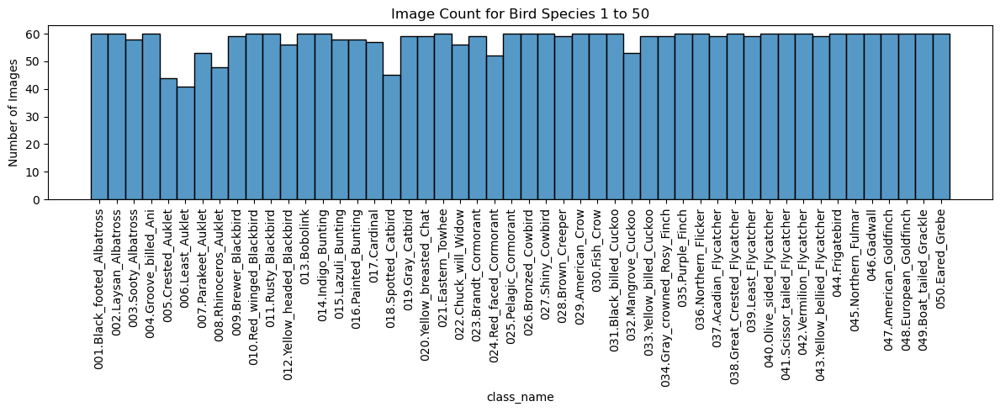

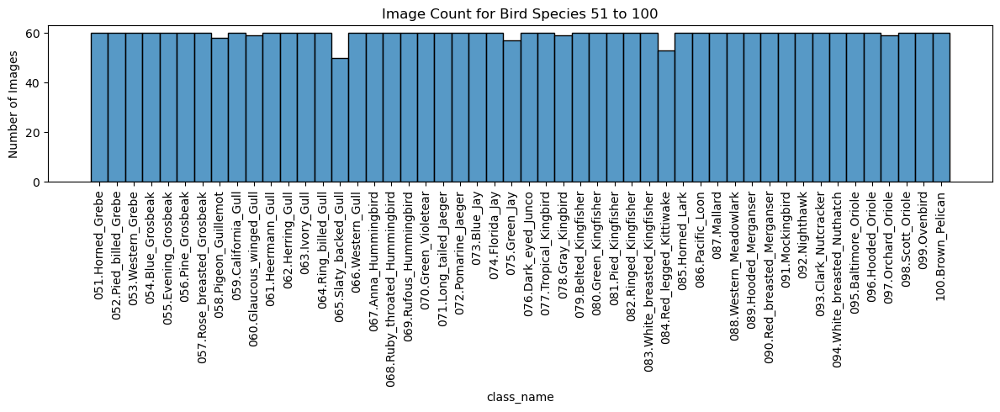

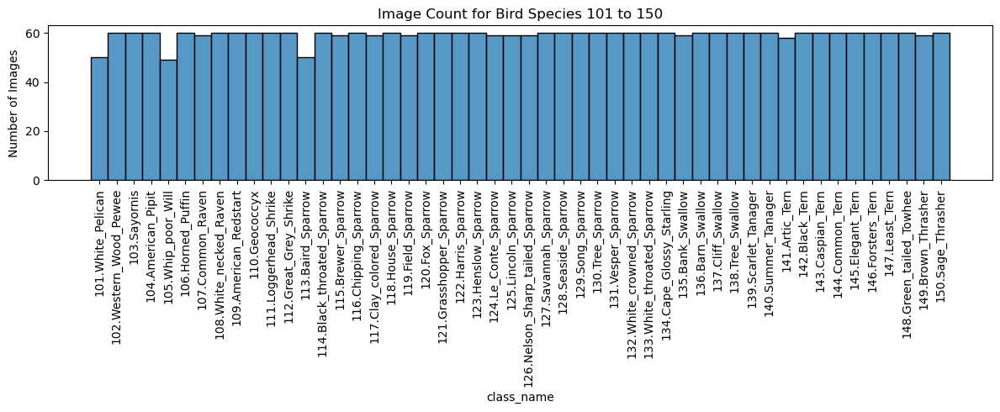

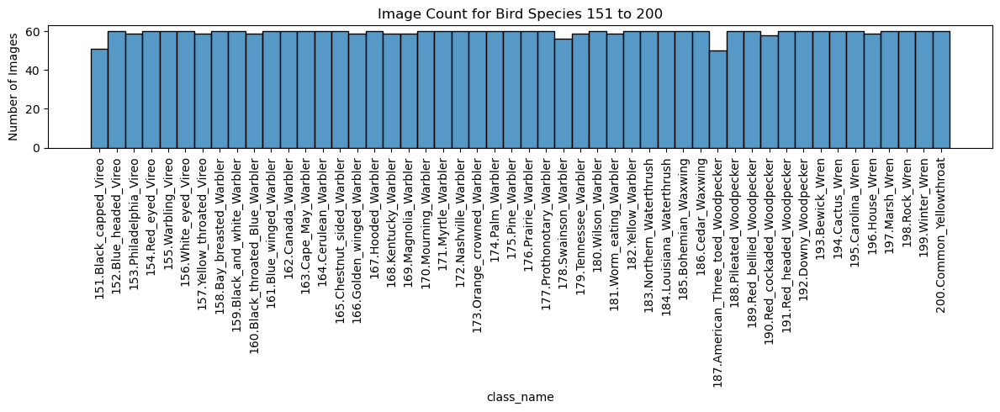

In [16]:
# Get sorted list of unique bird species
unique_classes = birds_df['class_name'].unique()
num_classes = len(unique_classes)
step = 50

for i in range(0, num_classes, step):
    subset = unique_classes[i:i+step]
    plt.figure(figsize=(12, 5))
    sns.histplot(data=birds_df[birds_df['class_name'].isin(subset)],
                 x='class_name', bins=step, kde=False)
    plt.xticks(rotation=90)
    plt.title(f"Image Count for Bird Species {i+1} to {i+step}")
    plt.ylabel("Number of Images")
    plt.tight_layout()
    plt.show()

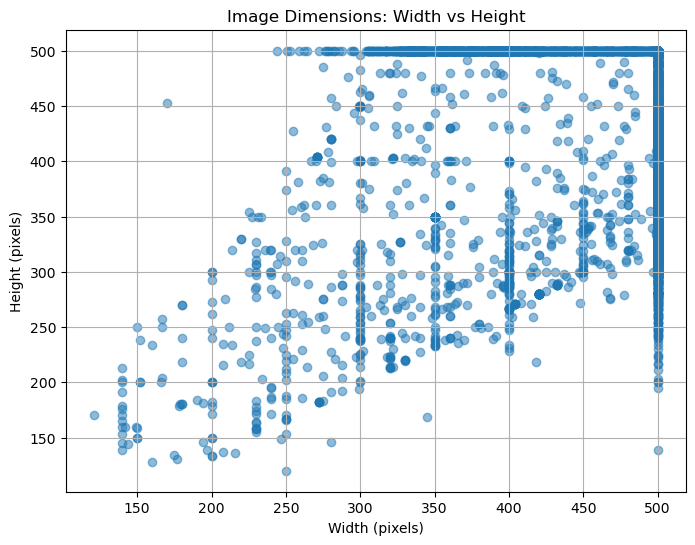

In [17]:
# Lists to hold width and height values
widths = []
heights = []

# Loop through all images
for path in birds_df["images_filepath"]:
    try:
        with Image.open(path) as img:
            width, height = img.size
            widths.append(width)
            heights.append(height)
    except Exception as e:
        print(f"Skipped {path}: {e}")

# Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(widths, heights, alpha=0.5)
plt.title("Image Dimensions: Width vs Height")
plt.xlabel("Width (pixels)")
plt.ylabel("Height (pixels)")
plt.grid(True)
plt.show()

Found 1004 image(s) with unusual dimensions.


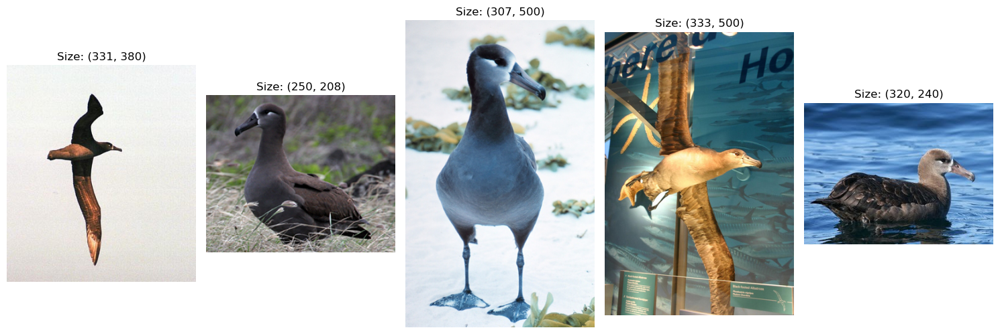

In [18]:
# Convert to NumPy arrays
widths_arr = np.array(widths)
heights_arr = np.array(heights)

# Calculate mean and standard deviation
w_mean, w_std = widths_arr.mean(), widths_arr.std()
h_mean, h_std = heights_arr.mean(), heights_arr.std()

# Identify images beyond 2 standard deviations in width or height
outlier_indices = [
    i for i, (w, h) in enumerate(zip(widths_arr, heights_arr))
    if abs(w - w_mean) > 2 * w_std or abs(h - h_mean) > 2 * h_std
]

print(f"Found {len(outlier_indices)} image(s) with unusual dimensions.")

# Display a few of the outlier images
from PIL import Image
fig, axes = plt.subplots(1, min(5, len(outlier_indices)), figsize=(15, 5))

for i, idx in enumerate(outlier_indices[:5]):
    path = birds_df.iloc[idx]['images_filepath']
    try:
        img = Image.open(path)
        axes[i].imshow(img)
        axes[i].set_title(f"Size: {img.size}")
        axes[i].axis('off')
    except Exception as e:
        print(f"Failed to open image {path}: {e}")

plt.tight_layout()
plt.show()

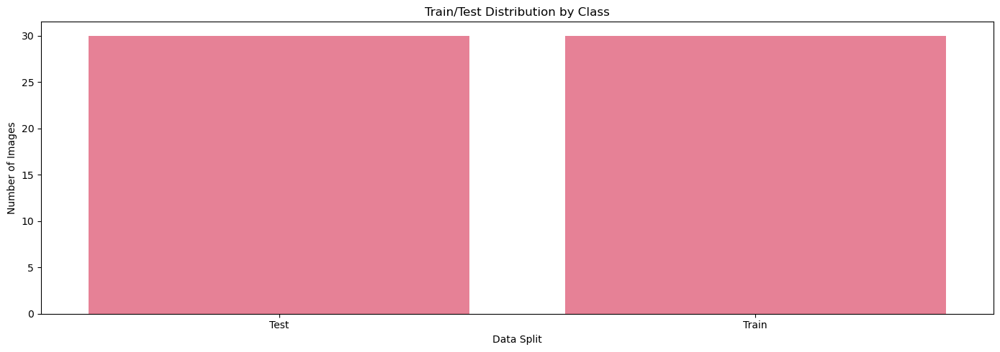

In [19]:
#Plots the data assigned to test and train
plt.figure(figsize=(14, 5))
sns.countplot(data=birds_df, x='is_train', hue='class_name', dodge=False)
plt.xticks([0, 1], ['Test', 'Train'])
plt.title("Train/Test Distribution by Class")
plt.xlabel("Data Split")
plt.ylabel("Number of Images")
plt.legend([],[], frameon=False)  # Hide legend for clarity
plt.tight_layout()
plt.show()

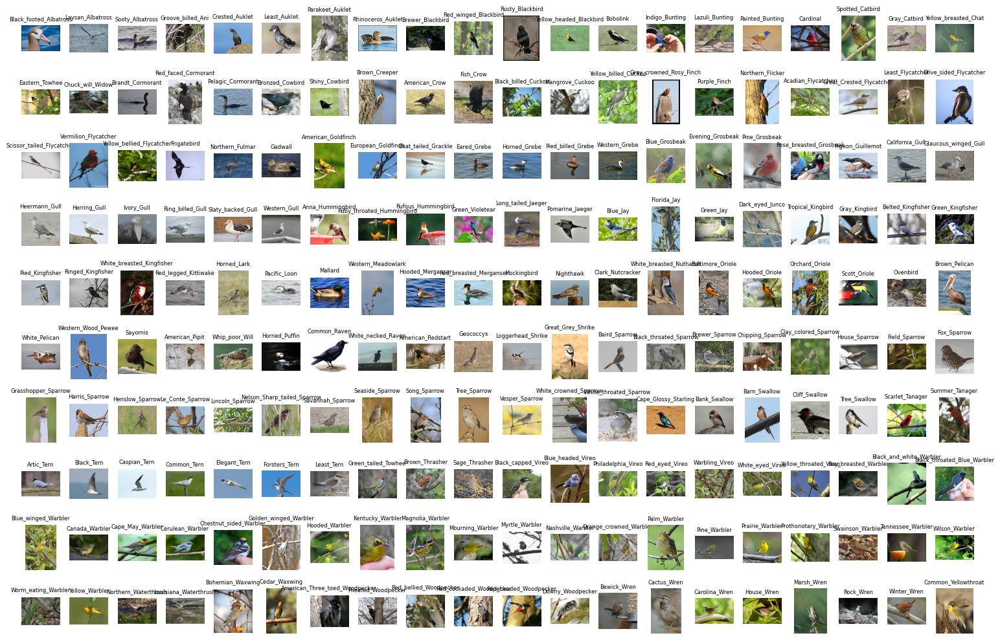

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Number of classes
NUM_CLASSES = birds_df['class_id'].nunique()

# Get one image per class
sample_df = birds_df.groupby('class_id').first().reset_index()

# Grid layout
cols = 20
rows = NUM_CLASSES // cols + int(NUM_CLASSES % cols > 0)
fig, axes = plt.subplots(rows, cols, figsize=(15, 10))
axes = axes.flatten()

for i, (_, row) in enumerate(sample_df.iterrows()):
    img = Image.open(row['images_filepath'])
    axes[i].imshow(img)
    axes[i].axis('off')
    # Shorten title by removing class ID prefix (e.g., "001.Red_winged_Blackbird" → "Red_winged_Blackbird")
    class_name = row['class_name'].split('.')[-1]
    axes[i].set_title(class_name, fontsize=6)

# Turn off unused axes
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


### Part D) Image Set Preprocessing

In [22]:
original_dir = os.path.join(dataset_loc, 'images')
processed_dir = os.path.join(dataset_loc, 'images_p')

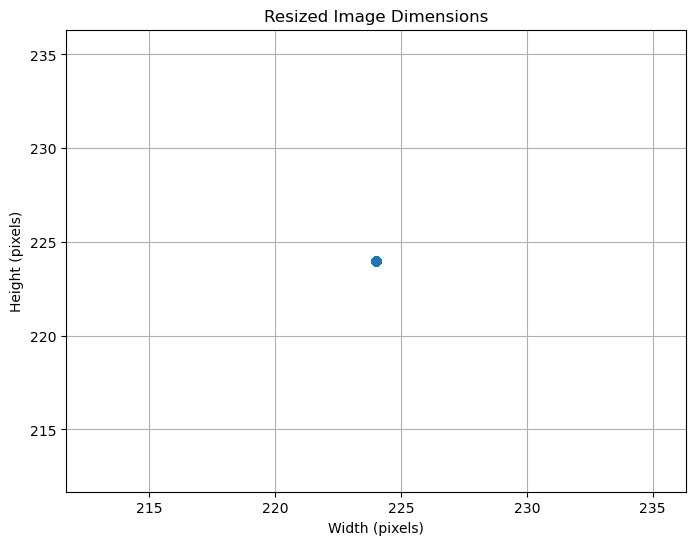

In [23]:
# Use the preprocessed directory
processed_dir = os.path.join(dataset_loc, 'images_p')

# Lists for widths and heights
new_widths = []
new_heights = []

# Walk and check dimensions
for root, dirs, files in os.walk(processed_dir):
    for file in files:
        if file.lower().endswith(('.jpg', '.jpeg', '.png')):
            path = os.path.join(root, file)
            try:
                with Image.open(path) as img:
                    w, h = img.size
                    new_widths.append(w)
                    new_heights.append(h)
            except Exception as e:
                print(f"Error reading {path}: {e}")

# Plot new dimensions
plt.figure(figsize=(8, 6))
plt.scatter(new_widths, new_heights, alpha=0.5)
plt.title("Resized Image Dimensions")
plt.xlabel("Width (pixels)")
plt.ylabel("Height (pixels)")
plt.grid(True)
plt.show()

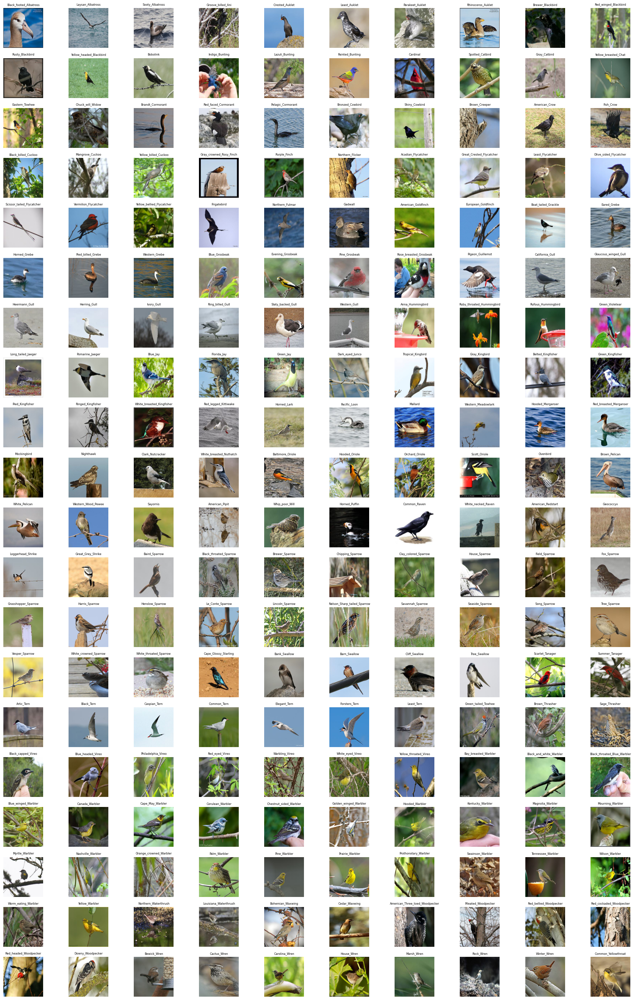

In [24]:
# One image per class
sample_df = birds_df.groupby('class_id').first().reset_index()

cols = 10
rows = len(sample_df) // cols + int(len(sample_df) % cols > 0)

fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 1.5))
axes = axes.flatten()

for i, (_, row) in enumerate(sample_df.iterrows()):
    img_path = row['images_filepath'].replace('/images/', '/images_p/')
    try:
        img = Image.open(img_path)
        axes[i].imshow(img)
        class_name = row['class_name'].split('.')[-1]
        axes[i].set_title(class_name, fontsize=6)
        axes[i].axis('off')
    except Exception as e:
        print(f"Could not load image {img_path}: {e}")

# Turn off any unused axes
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

### PART E) Baseline Model
    The baseline model consists of a fully connected Neural Network

In [26]:
# Create a new column for resized image paths
birds_df["resized_path"] = birds_df["filepath"].apply(
    lambda x: os.path.join(dataset_loc, "images_p", x)
)


In [28]:
birds_df.head(1)

,image_id,filepath,class_id,is_train,class_name,images_filepath,resized_path
0,1,001.Black_footed_Albatross/Black_Footed_Albatr...,1,0,001.Black_footed_Albatross,C:\Users\Baron\Documents\Grad_School\EE_258\pr...,C:\Users\Baron\Documents\Grad_School\EE_258\pr...


In [32]:
# Save dataframe to csv to be analyzed.
birds_df.to_csv(r"C:\Users\Baron\Documents\Grad_School\EE_258\project\birds_df.csv", index=True)

In [40]:
## This code is responsible for choosing only the only the odd index of my dataframe.
    #In theory, this will decrease the number of output classes from 200 -> 100.

ouput_class_size = 100

# Step 1: Get 100 random class IDs
selected_classes = np.random.choice(birds_df['class_id'].unique(), size=ouput_class_size, replace=False)

# Step 2: Filter the dataframe to only include those classes
birds_df_filtered = birds_df[birds_df['class_id'].isin(selected_classes)].reset_index(drop=True)

# Step 3: Create a mapping from original class_id → 0 to 99
selected_class_ids = sorted(birds_df_filtered['class_id'].unique())
class_id_map = {orig_id: new_id for new_id, orig_id in enumerate(selected_class_ids)}

# Step 4: Apply the mapping
birds_df_filtered['class_id'] = birds_df_filtered['class_id'].map(class_id_map)

# Step 5: Verify
print(f"Filtered dataframe shape: {birds_df_filtered.shape}")
print(f"Number of unique classes: {birds_df_filtered['class_id'].nunique()}")
print(f"Class ID range: {birds_df_filtered['class_id'].min()} to {birds_df_filtered['class_id'].max()}")
print(birds_df_filtered['is_train'].value_counts())  # Check train/test split



Filtered dataframe shape: (5883, 7)
Number of unique classes: 100
Class ID range: 0 to 99
is_train
1    2997
0    2886
Name: count, dtype: int64


In [42]:
### Sanity Check of birds reorganizing
# Reverse the mapping to validate integrity
reverse_map = {v: k for k, v in class_id_map.items()}

# Group by new class_id and check all original class_ids are the same
for new_id, group in birds_df_filtered.groupby('class_id'):
    original_ids = birds_df[birds_df['class_id'] == reverse_map[new_id]]['class_id'].unique()
    assert len(original_ids) == 1, f"Class {new_id} maps to multiple original classes!"


In [44]:
# Model Assertion for fully connected neural network

input_shape = (224, 224, 3)  # Width x Height x Channels
num_classes = ouput_class_size

# Define your FCNN model factory
def build_model():
    model = Sequential([
        Input(shape=(224, 224, 3)),
        AveragePooling2D(pool_size=(4, 4)),
        Flatten(),
        Dense(1024, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),
        Dense(512, activation='relu'),
        Dropout(0.4),
        Dense(256, activation='relu'),
        Dropout(0.3),
        Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer=Adam(learning_rate=1e-4),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

In [37]:
# Build a fresh model each time
model_dense = build_model()

In [39]:
# View model summary
model_dense.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ average_pooling2d (AveragePooling2D) │ (None, 56, 56, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 9408)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1024)                │       9,634,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 1024)                │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 512)                 │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 100)                 │          25,700 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,320,740 (39.37 MB)

 Trainable params: 10,318,692 (39.36 MB)

 Non-trainable params: 2,048 (8.00 KB)

In [41]:
# Step 1: Split dataframes fro training and test and validation
train_birds_df = birds_df_filtered[birds_df_filtered["is_train"] == 1].copy()
test_birds_df = birds_df_filtered[birds_df_filtered["is_train"] == 0].copy()

val_df, final_test_df = train_test_split(
    test_birds_df,
    test_size=0.5,
    stratify=test_birds_df['class_id'],
    random_state=42
)

In [43]:
def load_images(df, target_size=(224, 224)):
    images = []
    labels = []

    for _, row in tqdm(df.iterrows(), total=len(df)):
        try:
            img = Image.open(row['resized_path']).convert('RGB')
            img = img.resize(target_size)
            img_array = np.array(img, dtype=np.float32) / 255.0
            images.append(img_array)
            labels.append(row['class_id'])
        except Exception as e:
            print(f"Failed to load {row['resized_path']}: {e}")
   
    return np.array(images, dtype=np.float32), np.array(labels)

In [45]:
#Uncomment for the final version
#Load the images
X_train, y_train = load_images(train_birds_df)
X_val, y_val = load_images(val_df)
x_test, y_test = load_images(final_test_df)


100%|█████████████████████████████████████████████████████████████████████████████| 1453/1453 [00:02<00:00, 627.74it/s]


In [36]:
print("First image pixel sample:", X_train[0, 0, 0])  # Should be ~0.0–1.0


First image pixel sample: [0.01176471 0.00784314 0.02745098]


In [37]:
# Preview the first image and label
print("Image shape:", X_train[0].shape)
print("Pixel values:\n", X_train[0])
print("Min pixel:", X_train[0].min())
print("Max pixel:", X_train[0].max())
print("Label:", y_train[0])

Image shape: (224, 224, 3)
Pixel values:
 [[[0.01176471 0.00784314 0.02745098]
  [0.04313726 0.03921569 0.05882353]
  [0.         0.         0.01568628]
  ...
  [0.         0.         0.01568628]
  [0.03137255 0.03529412 0.05098039]
  [0.00784314 0.01176471 0.02745098]]

 [[0.         0.         0.01568628]
  [0.31764707 0.3137255  0.33333334]
  [0.41568628 0.4117647  0.43137255]
  ...
  [0.4117647  0.41568628 0.43137255]
  [0.31764707 0.32156864 0.3372549 ]
  [0.         0.         0.01568628]]

 [[0.13725491 0.13333334 0.15294118]
  [0.77254903 0.76862746 0.7882353 ]
  [0.99607843 0.99215686 1.        ]
  ...
  [0.96862745 0.972549   0.9882353 ]
  [0.75686276 0.7607843  0.7764706 ]
  [0.13725491 0.14117648 0.15686275]]

 ...

 [[0.12156863 0.12941177 0.10980392]
  [0.7764706  0.78431374 0.77254903]
  [0.9098039  0.91764706 0.90588236]
  ...
  [0.8392157  0.84705883 0.84313726]
  [0.7411765  0.7490196  0.7372549 ]
  [0.16470589 0.17254902 0.16078432]]

 [[0.         0.00392157 0.     

In [38]:
from keras.callbacks import EarlyStopping

early_stop = EarlyStopping(
    monitor='val_loss',      # You can also use 'val_accuracy'
    patience=5,              # Stop if no improvement for 3 epochs
    restore_best_weights=True  # Roll back to the best weights
)

In [39]:
# Check for overlap
overlap = set(train_birds_df['image_id']) & set(test_birds_df['image_id'])
print(f"Number of overlapping images: {len(overlap)}")


Number of overlapping images: 0


In [40]:
## Run model fit
model_dense.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=50,                     # Can be high; early stopping will interrupt it
    callbacks=[early_stop]
)


Epoch 1/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - accuracy: 0.0108 - loss: 5.2933 - val_accuracy: 0.0116 - val_loss: 4.6566
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.0131 - loss: 4.8086 - val_accuracy: 0.0144 - val_loss: 4.5898
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.0152 - loss: 4.7141 - val_accuracy: 0.0171 - val_loss: 4.5701
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.0201 - loss: 4.6665 - val_accuracy: 0.0240 - val_loss: 4.5392
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.0226 - loss: 4.5892 - val_accuracy: 0.0267 - val_loss: 4.5437
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.0277 - loss: 4.5821 - val_accuracy: 0.0192 - val_loss: 4.5592
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.0353 - loss: 4.5295 - val_accuracy: 0.0281 - val_loss: 4.5322
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - accuracy: 0.0385 - loss: 4.5063 - val_accuracy: 0.0253 - v

In [41]:
test_loss, test_accuracy = model_dense.evaluate(x_test, y_test)
print(f"\nTest Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.0576 - loss: 4.0887 

Test Loss: 4.1320
Test Accuracy: 0.0561


In [42]:
model_dense.save("weights/model_dense_baseline.h5")

46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step  


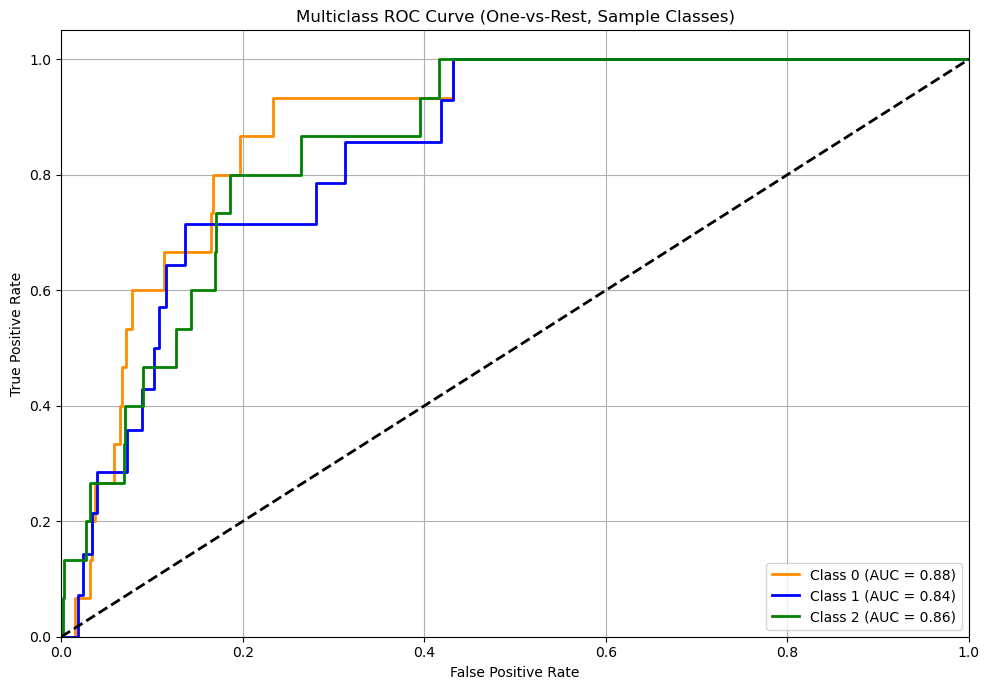

In [43]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
# Step 1: Predict class probabilities
y_score = model_dense.predict(x_test)  # Shape: (num_samples, num_classes)

# Step 2: Convert y_val to one-hot
y_val_bin = label_binarize(y_test, classes=np.arange(num_classes))  # Shape: (num_samples, num_classes)

# Step 3: Compute ROC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Step 4: Plot ROC for a few selected classes (e.g., 0, 1, 2)
plt.figure(figsize=(10, 7))
colors = ['darkorange', 'blue', 'green']
for i, color in zip([0, 1, 2], colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multiclass ROC Curve (One-vs-Rest, Sample Classes)')
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


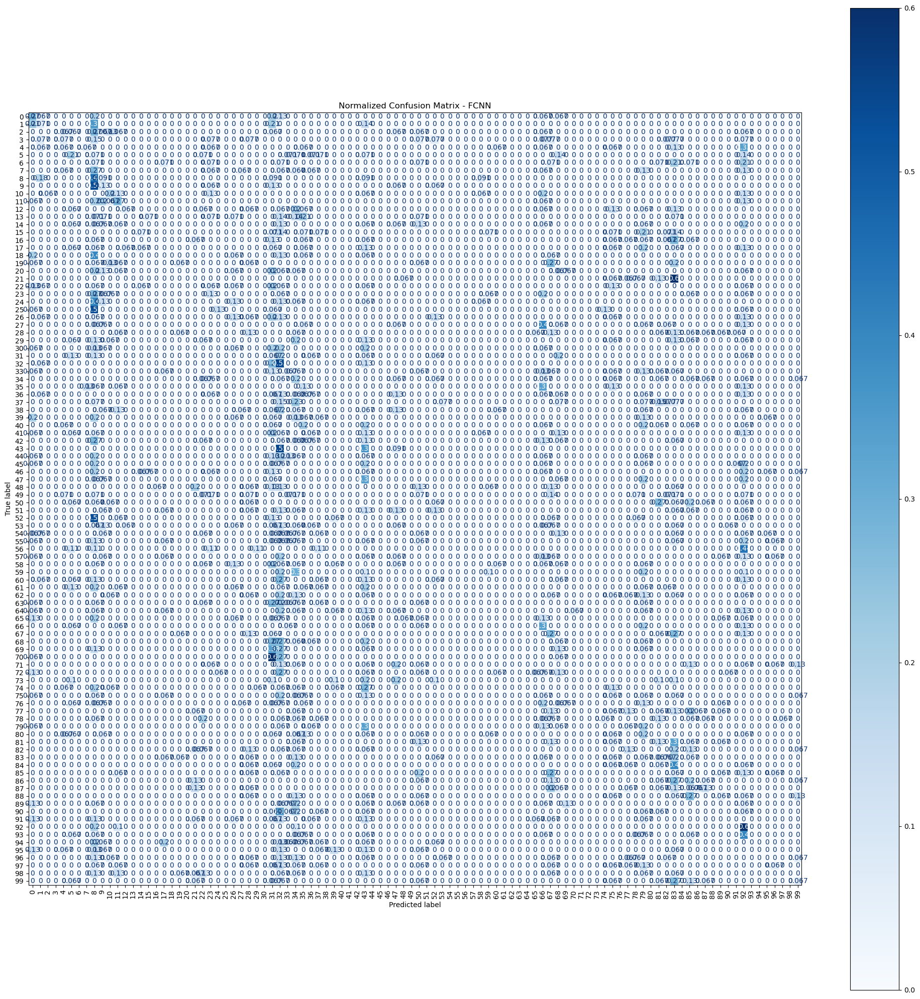

In [44]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Step 1: Get predictions from your model
# Get predictions
y_pred_probs = model_dense.predict(x_test)
y_pred = np.argmax(y_pred_probs, axis=1)

# Normalize confusion matrix (rows sum to 1)
cm = confusion_matrix(y_test, y_pred, normalize='true')

# Plot it larger
fig, ax = plt.subplots(figsize=(20, 20))  # Bigger figure
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues', ax=ax, colorbar=True, xticks_rotation=90)
plt.title("Normalized Confusion Matrix - FCNN")
plt.tight_layout()
plt.show()

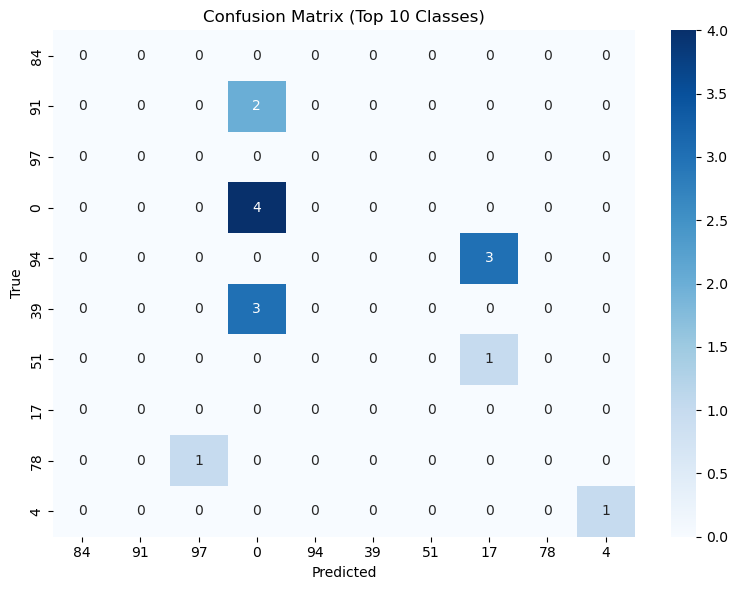

In [45]:
# Top N most common true classes
from collections import Counter 
top_classes = [cls for cls, _ in Counter(y_test).most_common(10)]

# Filter confusion matrix to top classes only
filtered_cm = confusion_matrix(y_test, y_pred)
filtered_cm = filtered_cm[np.ix_(top_classes, top_classes)]

# Plot
plt.figure(figsize=(8, 6))
sns.heatmap(filtered_cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=top_classes, yticklabels=top_classes)
plt.title("Confusion Matrix (Top 10 Classes)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.tight_layout()
plt.show()

### Part F) Models Utilized
    Futher models more complex than Fully Connected Neural Network were utilized

In [47]:
### Raw CNN Attempt

ouput_class_size = 100
input_shape = (224, 224, 3)  # Weight x Height x Channels
num_classes = ouput_class_size

# Best Test Accuracy / Poor Training Accuracy
def build_cnn_model_0(): 
    model_0 = Sequential([
        Input(shape=(224, 224, 3)),

        # Convolution Block 1
        Conv2D(32, (3, 3), activation='relu', padding='same'),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),

        # Convolution Block 2
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),

        # Convolution Block 3
        Conv2D(128, (3, 3), activation='relu', padding='same'),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),

        Flatten(),
        Dense(512, activation='relu'),   # ← 1st dense layer
        Dropout(0.5),
        Dense(256, activation='relu'),   # ← 2nd dense layer
        Dropout(0.3),
        Dense(num_classes, activation='softmax')
    ])

    model_0.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model_0

# Best Training Accuracy / Poor Test Accuracy
def build_cnn_model_1():
    model_1 = Sequential([
        Input(shape=(224, 224, 3)),

        # Convolution Block 1
        Conv2D(32, (3, 3), activation='relu', padding='same'),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),

        # Convolution Block 2
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),

        # Convolution Block 3
        Conv2D(128, (3, 3), activation='relu', padding='same'),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),

        Flatten(),
        Dense(256, activation='relu'),
        Dropout(0.5),

        Dense(num_classes, activation='softmax')
    ])

    model_1.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model_1

## Copy of model_cnn_0, regularization added.
def build_cnn_model_2():
    model_2 = Sequential([
        Input(shape=(224, 224, 3)),

        # Convolution Block 1
        Conv2D(32, (3, 3), activation='relu', padding='same', kernel_regularizer=l1(1e-4)),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),

        # Convolution Block 2
        Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=l1(1e-4)),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),

        # Convolution Block 3
        Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=l1(1e-4)),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),

        Flatten(),
        Dense(512, activation='relu', kernel_regularizer=l1(1e-4)),
        Dropout(0.5),
        Dense(256, activation='relu', kernel_regularizer=l1(1e-4)),
        Dropout(0.3),

        Dense(num_classes, activation='softmax', kernel_regularizer=l1(1e-4))
    ])

    model_2.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model_2

def build_mlp_model():
    model = Sequential([
        Input(shape=(224, 224, 3)),     # Image input
        Flatten(),                      # Flatten to vector (224*224*3 = 150,528)

        Dense(1024, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),

        Dense(512, activation='relu'),
        Dropout(0.4),

        Dense(256, activation='relu'),
        Dropout(0.3),

        Dense(num_classes, activation='softmax')  # Output layer for classification
    ])

    model.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model


In [49]:
# Build a fresh model each time
model_cnn_0 = build_cnn_model_0()
model_cnn_1 = build_cnn_model_1()
model_cnn_2_l1reg = build_cnn_model_2()
model_mlp_0 = build_mlp_model()

In [50]:
# View model summary
model_cnn_0.summary()
model_cnn_1.summary()
model_cnn_2_l1reg.summary()
model_mlp_0.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 112, 112, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 56, 56, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 28, 28, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 100352)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 512)                 │      51,380,736 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 100)                 │          25,700 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 51,631,908 (196.96 MB)

 Trainable params: 51,631,460 (196.96 MB)

 Non-trainable params: 448 (1.75 KB)

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 112, 112, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 56, 56, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 28, 28, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 100352)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 256)                 │      25,690,368 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 100)                 │          25,700 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,810,212 (98.46 MB)

 Trainable params: 25,809,764 (98.46 MB)

 Non-trainable params: 448 (1.75 KB)

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)                    │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 112, 112, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 56, 56, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 28, 28, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 100352)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 512)                 │      51,380,736 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 100)                 │          25,700 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 51,631,908 (196.96 MB)

 Trainable params: 51,631,460 (196.96 MB)

 Non-trainable params: 448 (1.75 KB)

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ flatten_4 (Flatten)                  │ (None, 150528)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 1024)                │     154,141,696 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 1024)                │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 512)                 │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 100)                 │          25,700 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 154,827,620 (590.62 MB)

 Trainable params: 154,825,572 (590.61 MB)

 Non-trainable params: 2,048 (8.00 KB)

In [53]:
from keras.callbacks import EarlyStopping

early_stop = EarlyStopping(
    monitor='val_loss',      # You can also use 'val_accuracy'
    patience=5,              # Stop if no improvement for 3 epochs
    restore_best_weights=True  # Roll back to the best weights
)

In [51]:
## Run model fit
model_cnn_0.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=50,                     # Can be high; early stopping will interrupt it
    callbacks=[early_stop]
)


Epoch 1/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 101s 1s/step - accuracy: 0.0098 - loss: 6.6664 - val_accuracy: 0.0103 - val_loss: 5.4335
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 95s 1s/step - accuracy: 0.0231 - loss: 4.5547 - val_accuracy: 0.0089 - val_loss: 5.4866
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 95s 1s/step - accuracy: 0.0389 - loss: 4.4713 - val_accuracy: 0.0164 - val_loss: 5.4348
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 97s 1s/step - accuracy: 0.0628 - loss: 4.3518 - val_accuracy: 0.0144 - val_loss: 4.8878
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 95s 1s/step - accuracy: 0.0882 - loss: 4.2388 - val_accuracy: 0.0226 - val_loss: 4.6600
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 95s 1s/step - accuracy: 0.1086 - loss: 4.0646 - val_accuracy: 0.0342 - val_loss: 4.5915
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 94s 1s/step - accuracy: 0.1136 - loss: 4.0352 - val_accuracy: 0.0329 - val_loss: 4.5767
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 94s 1s/step - accuracy: 0.1536 - loss: 3.8260 - val_accuracy: 0.0370 - val_loss

In [52]:
test_loss, test_accuracy = model_cnn_0.evaluate(x_test, y_test)
print(f"\nTest Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

46/46 ━━━━━━━━━━━━━━━━━━━━ 7s 143ms/step - accuracy: 0.0579 - loss: 4.4480

Test Loss: 4.4472
Test Accuracy: 0.0609


In [53]:
# Step 1: Predict class probabilities
y_pred_probs = model_cnn_0.predict(x_test)

# Step 2: Convert to predicted class labels
y_pred = np.argmax(y_pred_probs, axis=1)

# Step 3: Print classification report
print(classification_report(y_test, y_pred, digits=3))

46/46 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step
              precision    recall  f1-score   support

           0      0.081     0.333     0.130        15
           1      0.143     0.071     0.095        14
           2      0.000     0.000     0.000        15
           3      0.028     0.154     0.048        13
           4      0.053     0.067     0.059        15
           5      0.000     0.000     0.000        14
           6      0.000     0.000     0.000        14
           7      0.000     0.000     0.000        15
           8      0.000     0.000     0.000        11
           9      0.000     0.000     0.000        15
          10      0.125     0.067     0.087        15
          11      0.000     0.000     0.000        15
          12      0.000     0.000     0.000        15
          13      0.083     0.071     0.077        14
          14      0.100     0.133     0.114        15
          15      0.034     0.071     0.047        14
          16      0.000     0.000     0.

C:\Users\Baron\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Baron\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Baron\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [54]:
model_cnn_0.save("weights/cnn_model_0.h5")

46/46 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step


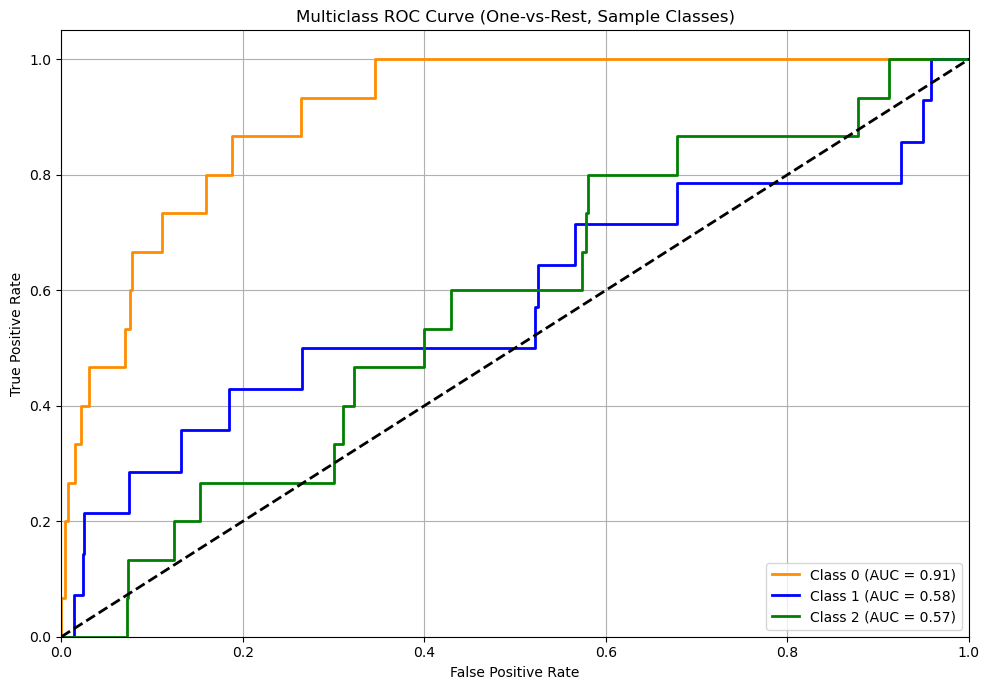

In [55]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
# Step 1: Predict class probabilities
y_score = model_cnn_0.predict(x_test)  # Shape: (num_samples, num_classes)

# Step 2: Convert y_val to one-hot
y_val_bin = label_binarize(y_test, classes=np.arange(num_classes))  # Shape: (num_samples, num_classes)

# Step 3: Compute ROC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Step 4: Plot ROC for a few selected classes (e.g., 0, 1, 2)
plt.figure(figsize=(10, 7))
colors = ['darkorange', 'blue', 'green']
for i, color in zip([0, 1, 2], colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multiclass ROC Curve (One-vs-Rest, Sample Classes)')
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

### Models

In [57]:
## Run model fit
model_cnn_1.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=50,                     # Can be high; early stopping will interrupt it
    callbacks=[early_stop]
)


Epoch 1/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 85s 873ms/step - accuracy: 0.0100 - loss: 6.2933 - val_accuracy: 0.0082 - val_loss: 6.2361
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 82s 871ms/step - accuracy: 0.0558 - loss: 4.3874 - val_accuracy: 0.0137 - val_loss: 6.9791
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 81s 865ms/step - accuracy: 0.1003 - loss: 4.1286 - val_accuracy: 0.0130 - val_loss: 7.6188
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 82s 872ms/step - accuracy: 0.1680 - loss: 3.6450 - val_accuracy: 0.0274 - val_loss: 6.0201
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 82s 869ms/step - accuracy: 0.2757 - loss: 3.0880 - val_accuracy: 0.0336 - val_loss: 5.1283
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 82s 869ms/step - accuracy: 0.3912 - loss: 2.5176 - val_accuracy: 0.0582 - val_loss: 4.7050
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 82s 870ms/step - accuracy: 0.5033 - loss: 1.8495 - val_accuracy: 0.0623 - val_loss: 4.8010
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 82s 868ms/step - accuracy: 0.5810 - loss: 1.5595 - val_accu

In [58]:
test_loss, test_accuracy = model_cnn_1.evaluate(x_test, y_test)
print(f"\nTest Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 134ms/step - accuracy: 0.0812 - loss: 4.7062

Test Loss: 4.6900
Test Accuracy: 0.0760


In [59]:
# Step 1: Predict class probabilities
y_pred_probs = model_cnn_1.predict(x_test)

# Step 2: Convert to predicted class labels
y_pred = np.argmax(y_pred_probs, axis=1)

# Step 3: Print classification report
print(classification_report(y_test, y_pred, digits=3))

46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 134ms/step
              precision    recall  f1-score   support

           0      0.182     0.133     0.154        15
           1      0.059     0.071     0.065        14
           2      0.000     0.000     0.000        15
           3      0.077     0.077     0.077        13
           4      0.133     0.267     0.178        15
           5      0.071     0.071     0.071        14
           6      0.000     0.000     0.000        14
           7      0.000     0.000     0.000        15
           8      0.083     0.091     0.087        11
           9      0.000     0.000     0.000        15
          10      0.130     0.200     0.158        15
          11      0.091     0.067     0.077        15
          12      0.200     0.200     0.200        15
          13      0.000     0.000     0.000        14
          14      0.111     0.067     0.083        15
          15      0.077     0.071     0.074        14
          16      0.000     0.000     0.

In [60]:
model_cnn_1.save("weights/cnn_model_1.h5")

46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step


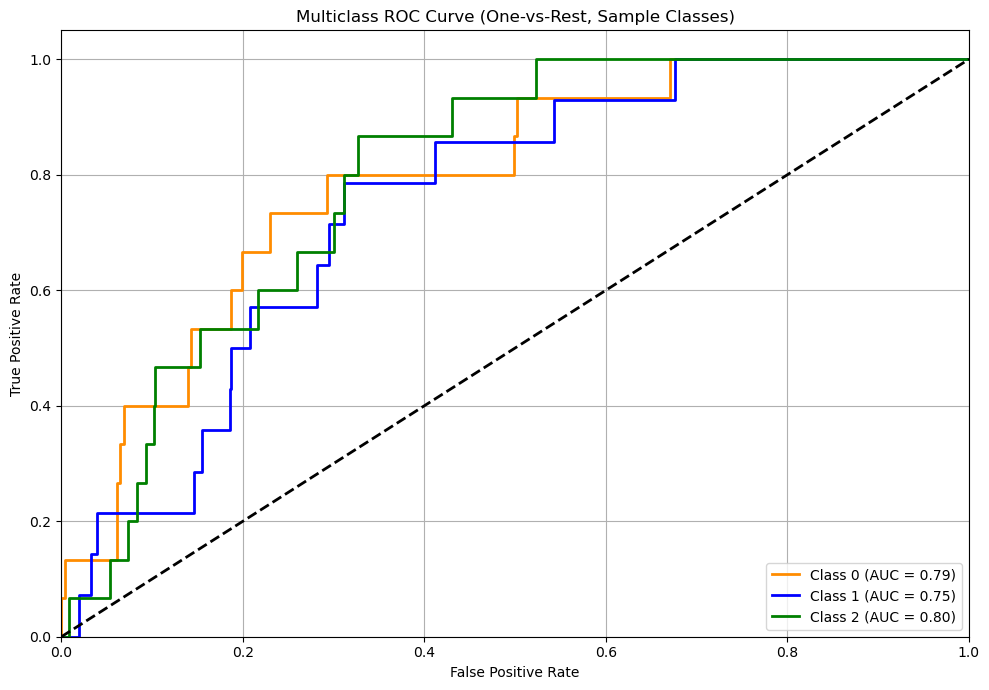

In [61]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
# Step 1: Predict class probabilities
y_score = model_cnn_1.predict(x_test)  # Shape: (num_samples, num_classes)

# Step 2: Convert y_val to one-hot
y_val_bin = label_binarize(y_test, classes=np.arange(num_classes))  # Shape: (num_samples, num_classes)

# Step 3: Compute ROC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Step 4: Plot ROC for a few selected classes (e.g., 0, 1, 2)
plt.figure(figsize=(10, 7))
colors = ['darkorange', 'blue', 'green']
for i, color in zip([0, 1, 2], colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multiclass ROC Curve (One-vs-Rest, Sample Classes)')
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

In [55]:
### Running the MLP Model 
model_mlp_0.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=50,                     # Can be high; early stopping will interrupt it
    callbacks=[early_stop]
)

Epoch 1/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 96s 983ms/step - accuracy: 0.0072 - loss: 5.1639 - val_accuracy: 0.0179 - val_loss: 4.8245
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 88s 937ms/step - accuracy: 0.0186 - loss: 4.7889 - val_accuracy: 0.0220 - val_loss: 4.6207
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 90s 953ms/step - accuracy: 0.0186 - loss: 4.6796 - val_accuracy: 0.0131 - val_loss: 4.6171
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 88s 937ms/step - accuracy: 0.0206 - loss: 4.6393 - val_accuracy: 0.0220 - val_loss: 4.5465
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 88s 933ms/step - accuracy: 0.0247 - loss: 4.6027 - val_accuracy: 0.0220 - val_loss: 4.5340
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 87s 925ms/step - accuracy: 0.0212 - loss: 4.5801 - val_accuracy: 0.0179 - val_loss: 4.5409
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 90s 953ms/step - accuracy: 0.0244 - loss: 4.5350 - val_accuracy: 0.0227 - val_loss: 4.5265
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 88s 935ms/step - accuracy: 0.0301 - loss: 4.5084 - val_accu

In [56]:
test_loss, test_accuracy = model_mlp_0.evaluate(x_test, y_test)
print(f"\nTest Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

46/46 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - accuracy: 0.0310 - loss: 4.3509     

Test Loss: 4.3358
Test Accuracy: 0.0337


In [57]:
# Step 1: Predict class probabilities
y_pred_probs = model_mlp_0.predict(x_test)

# Step 2: Convert to predicted class labels
y_pred = np.argmax(y_pred_probs, axis=1)

# Step 3: Print classification report
print(classification_report(y_test, y_pred, digits=3))

46/46 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step
              precision    recall  f1-score   support

           0      0.000     0.000     0.000        15
           1      0.019     0.143     0.033         7
           2      0.000     0.000     0.000        15
           3      0.049     0.231     0.081        13
           4      0.017     0.067     0.027        15
           5      0.041     0.400     0.074        15
           6      0.000     0.000     0.000        14
           7      0.000     0.000     0.000        13
           8      0.016     0.143     0.028         7
           9      0.000     0.000     0.000        13
          10      0.000     0.000     0.000        15
          11      0.056     0.455     0.100        11
          12      0.000     0.000     0.000        15
          13      0.052     0.467     0.093        15
          14      0.000     0.000     0.000        15
          15      0.000     0.000     0.000        15
          16      0.000     0.000     0.0

C:\Users\Baron\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Baron\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Baron\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


46/46 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step 


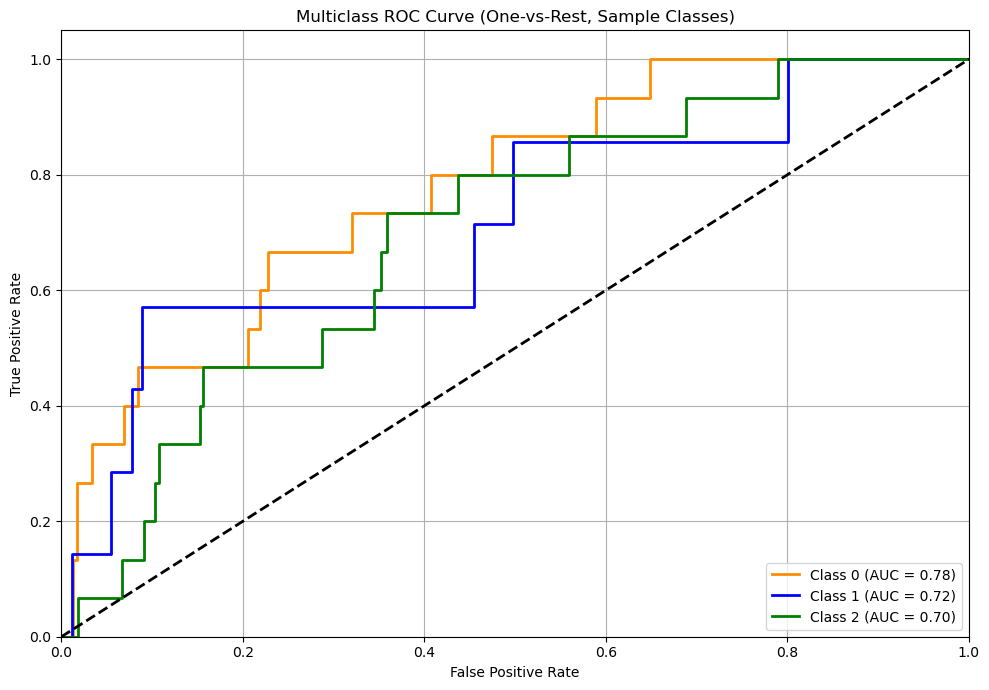

In [58]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
# Step 1: Predict class probabilities
y_score = model_mlp_0.predict(x_test)  # Shape: (num_samples, num_classes)

# Step 2: Convert y_val to one-hot
y_val_bin = label_binarize(y_test, classes=np.arange(num_classes))  # Shape: (num_samples, num_classes)

# Step 3: Compute ROC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Step 4: Plot ROC for a few selected classes (e.g., 0, 1, 2)
plt.figure(figsize=(10, 7))
colors = ['darkorange', 'blue', 'green']
for i, color in zip([0, 1, 2], colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multiclass ROC Curve (One-vs-Rest, Sample Classes)')
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

### Part G) Model Improvements
    1. Data Augmentation
    2. Regularization
    3. Hyperparameter Selection

In [60]:
X_train_aug = X_train

In [61]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create the generator with augmentations
image_aug_gen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1
)


In [62]:
## Run model fit
model_cnn_1.fit(
    image_aug_gen.flow(X_train_aug, y_train, batch_size=32),
    validation_data=(X_val, y_val),
    epochs=50,                     # Can be high; early stopping will interrupt it
    callbacks=[early_stop]
)

C:\Users\Baron\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 100s 1s/step - accuracy: 0.0139 - loss: 6.0918 - val_accuracy: 0.0103 - val_loss: 6.1991
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 88s 928ms/step - accuracy: 0.0180 - loss: 4.6195 - val_accuracy: 0.0096 - val_loss: 7.1613
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 88s 929ms/step - accuracy: 0.0151 - loss: 4.6184 - val_accuracy: 0.0124 - val_loss: 6.3493
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 87s 924ms/step - accuracy: 0.0168 - loss: 4.5821 - val_accuracy: 0.0138 - val_loss: 5.4709
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 87s 927ms/step - accuracy: 0.0155 - loss: 4.5871 - val_accuracy: 0.0158 - val_loss: 4.6915
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 87s 922ms/step - accuracy: 0.0174 - loss: 4.5667 - val_accuracy: 0.0289 - val_loss: 4.5607
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 87s 925ms/step - accuracy: 0.0156 - loss: 4.5621 - val_accuracy: 0.0248 - val_loss: 4.5623
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 88s 929ms/step - accuracy: 0.0232 - loss: 4.5562 - val_accura

In [64]:
test_loss, test_accuracy = model_cnn_1.evaluate(x_test, y_test)
print(f"\nTest Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

46/46 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - accuracy: 0.0299 - loss: 4.4337

Test Loss: 4.4189
Test Accuracy: 0.0323


46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step


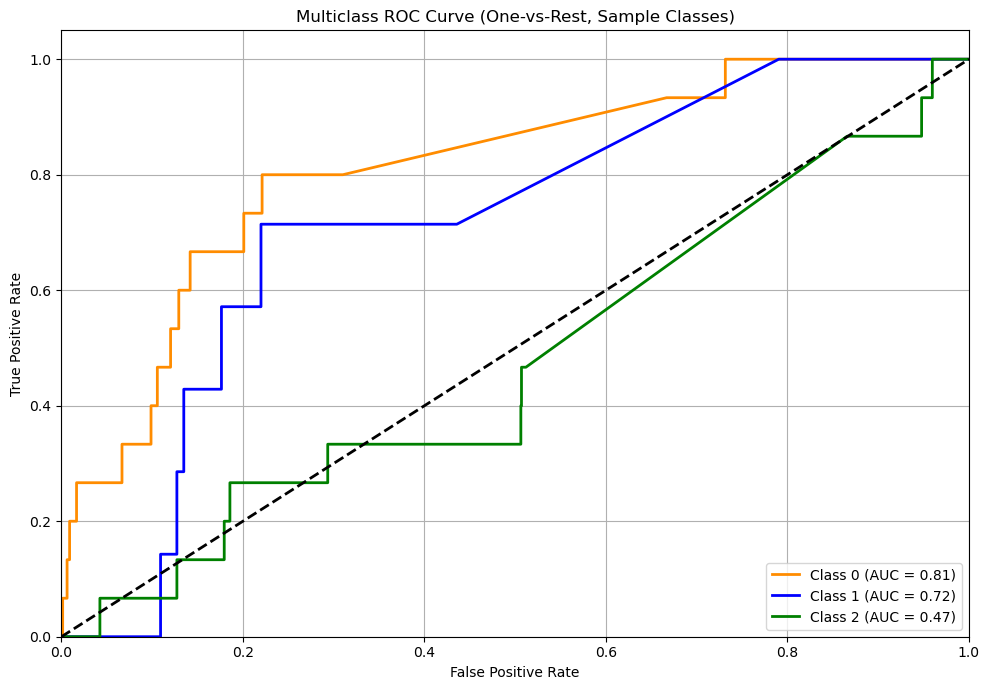

In [65]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
# Step 1: Predict class probabilities
y_score = model_cnn_1.predict(x_test)  # Shape: (num_samples, num_classes)

# Step 2: Convert y_val to one-hot
y_val_bin = label_binarize(y_test, classes=np.arange(num_classes))  # Shape: (num_samples, num_classes)

# Step 3: Compute ROC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Step 4: Plot ROC for a few selected classes (e.g., 0, 1, 2)
plt.figure(figsize=(10, 7))
colors = ['darkorange', 'blue', 'green']
for i, color in zip([0, 1, 2], colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multiclass ROC Curve (One-vs-Rest, Sample Classes)')
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

In [66]:
## Run model fit
model_cnn_2_l1reg.fit(
    image_aug_gen.flow(X_train_aug , y_train, batch_size=32),
    validation_data=(X_val, y_val),
    epochs=50,                     # Can be high; early stopping will interrupt it
    callbacks=[early_stop]
)

C:\Users\Baron\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 117s 1s/step - accuracy: 0.0129 - loss: 27.5128 - val_accuracy: 0.0103 - val_loss: 25.3960
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 114s 1s/step - accuracy: 0.0127 - loss: 24.6072 - val_accuracy: 0.0103 - val_loss: 24.4892
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 113s 1s/step - accuracy: 0.0137 - loss: 23.1441 - val_accuracy: 0.0117 - val_loss: 22.4514
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 114s 1s/step - accuracy: 0.0112 - loss: 21.4295 - val_accuracy: 0.0145 - val_loss: 20.1769
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 112s 1s/step - accuracy: 0.0104 - loss: 19.5852 - val_accuracy: 0.0138 - val_loss: 18.1262
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 112s 1s/step - accuracy: 0.0116 - loss: 17.6396 - val_accuracy: 0.0131 - val_loss: 16.1863
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 113s 1s/step - accuracy: 0.0117 - loss: 15.7097 - val_accuracy: 0.0172 - val_loss: 14.3246
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 112s 1s/step - accuracy: 0.0096 - loss: 13.8905 - val_accur

In [67]:
test_loss, test_accuracy = model_cnn_1.evaluate(x_test, y_test)
print(f"\nTest Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 139ms/step - accuracy: 0.0299 - loss: 4.4337

Test Loss: 4.4189
Test Accuracy: 0.0323


46/46 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step


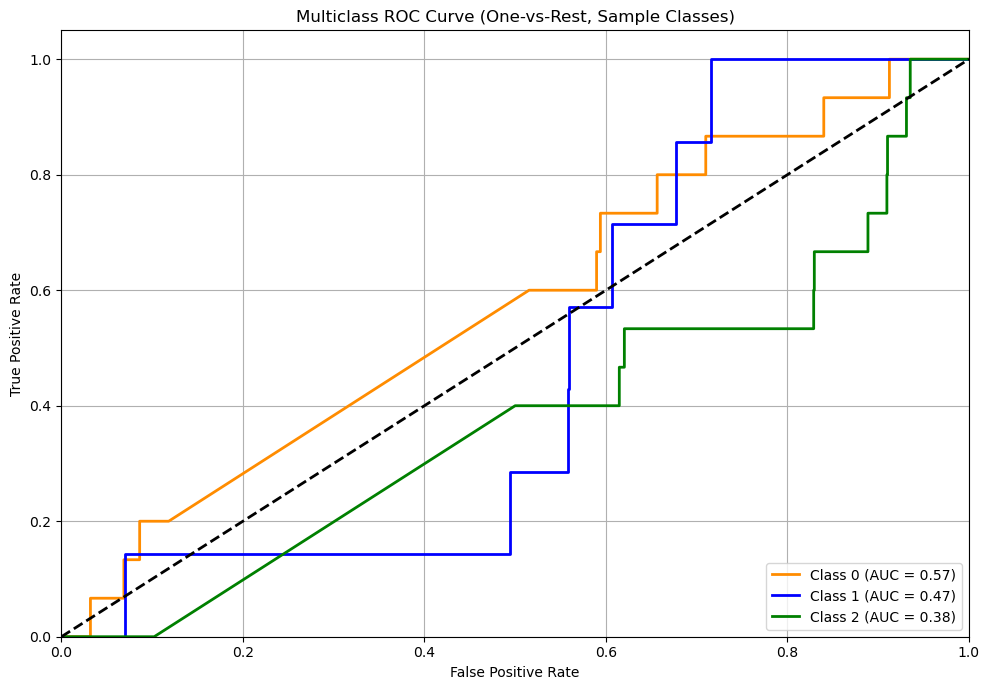

In [68]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
# Step 1: Predict class probabilities
y_score = model_cnn_2_l1reg.predict(x_test)  # Shape: (num_samples, num_classes)

# Step 2: Convert y_val to one-hot
y_val_bin = label_binarize(y_test, classes=np.arange(num_classes))  # Shape: (num_samples, num_classes)

# Step 3: Compute ROC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Step 4: Plot ROC for a few selected classes (e.g., 0, 1, 2)
plt.figure(figsize=(10, 7))
colors = ['darkorange', 'blue', 'green']
for i, color in zip([0, 1, 2], colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multiclass ROC Curve (One-vs-Rest, Sample Classes)')
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

In [75]:
%%javascript
Jupyter.notebook.save_checkpoint();

<IPython.core.display.Javascript object>